# Section 9:  Generating Noise Simulations with DR4 split data.  

This Section will generate a set of simulated noise maps necessary for building power spectra convariance matrices, calculating transfer functions, and performing consistency checks. In particular, we step through the noise map prescription available in the appendix of [Choi et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=choi_etal_2020.pdf). For simplicity, we consider only one season/patch/array/freq combination (s13/D6/PA1/150 GHz), while in reality the full pipeline performs an analogous process for all such data sets.

To return to the main notebook or to view a different section use the links in the table of contents.

Notebook Info | Value
---|---
Dependencies | `numpy`, `scipy`, `healpy`, `matplotlib`, `pixell`
Data products | act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_set{0-3}_map_srcfree.fits
| act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_coadd_map_srcfree.fits
| act_dr4.01_D6_apo_w0.fits
| act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_set{0-3}_ivar.fits
| act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_coadd_ivar.fits
| act_dr4.01_s13_D6_pa1_coadd_est_True_covsqrt.fits
Memory usage | ~2-4GB
Contributors | Maya Mallaby-Kay, Zach Atkins

## Table of contents

 --- 
> [Section 1](Section_1_Introduction.ipynb): Introduction to ACT Data Release 4

> [Section 2](Section_2_coadded_maps.ipynb): S08-16 Coadded maps from [Naess et al. (2020)](https://www.overleaf.com/5395816498bsknshgxbmyr) and an Introduction to Pixell

> [Section 3](Section_3_HEALPix_CAR_Conversions.ipynb):  Demonstration of methods to convert maps between HEALPix format and the CAR format.

> [Section 4](Section_4_visualize_objects.ipynb):  Guide to using Pixell to look at objects in the maps and stacking our maps on catalogue positions.

> [Section 5](Section_5_Lensing_maps.ipynb):  Introduction to the Lensing maps from [Darwish et al](https://arxiv.org/pdf/2004.01139.pdf)

> [Section 6](Section_6_Component_separated_maps.ipynb):  Guide to the use of the Component Separated maps from [Madhavacheril et al. (2020)](https://arxiv.org/abs/1911.05717)

> [Section 7](Section_7_power_spectra_part_1.ipynb): Harmonic Analysis using CAR maps [Naess et al, in preparation]

> [Section 8](Section_8_power_spectra_part_2.ipynb): Power Spectrum example using Nawrapper [Aiola et al] and [Choi et al] 

> [Section 9](Section_9_Noise_sims.ipynb): Generating Noise Simulations 

> [Section 10](Section_10_E_B_maps.ipynb):  Look at how to generate E and B maps from I, Q, U maps. 

> [Section 11](Section_11_ACT_likelihood.ipynb): Using the ACT Likelihood code
 
> [Section 12](Section_12_delensing_param_shifts.ipynb):  Delensing the CMB powerspectrum and comparing the delensed and lensed parameters from [Han et al. 2020, in preparation]

---

## Part 1: Import and Prepare the Data

As before, we begin by running the first notebook to import necessary packages and define the data path. Then we redefine our plotting convencience function and some handy plotting keywords to pass to enplot.plot:

In [1]:
%run Section_1_Introduction.ipynb

def eshow(x,**kwargs): 
    ''' Define a function to help us plot the maps neatly '''
    plots = enplot.get_plots(x, **kwargs)
    enplot.show(plots, method = 'ipython')

map_kwargs = dict(downgrade = 4, ticks = 5, colorbar = True)
fourier_kwargs = dict(downgrade = 4, nolabels = True, grid = False, colorbar = True)

The noise prescription utilizes "splits" of the data, which are maps generated from non-overlapping, interweaved slices of the full TOD. Each dataset (season/patch/array/frequency) has 4 splits with the exception of the AA patch, which has 2. We release maps of all splits, as well as the coadded maps for each dataset, in DR4 (see [Aiola et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=ACT_DR4_A20_v20200420.pdf), Table 2). 

Let's load the set of (4) splits for s13/D6/PA1/150 GHz, as well as the coadded map. We also load the apodized boundary window for the maps, which is common to every dataset within a given patch. The procedure for generating this boundary window is detailed in [Choi et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=choi_etal_2020.pdf):

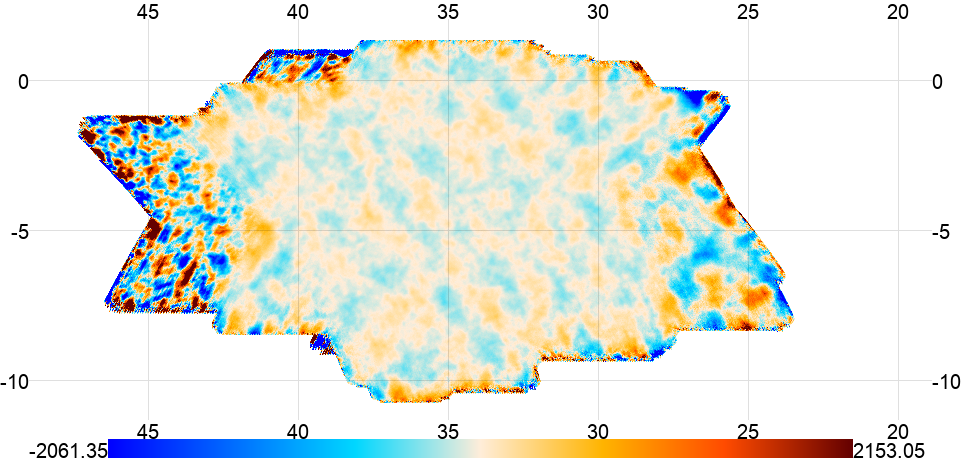

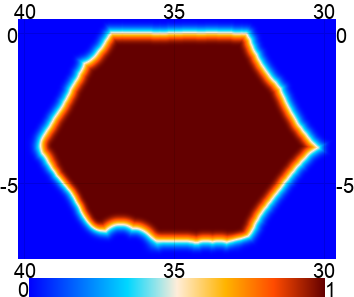

In [2]:
# Load the map-based splits and their coadd for the s13/D6/PA1 data set
splits = [enmap.read_map(path + f'act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_set{i}_map_srcfree.fits') for i in range(4)]
coadd = enmap.read_map(path + 'act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_coadd_map_srcfree.fits')

# Convert splits from list to enmap
splits = enmap.enmap(splits)

# Load the common boundary window for D6
window = enmap.read_map(path + 'act_dr4.01_D6_apo_w0.fits')

# Plot the first split I map and the window
eshow(splits[0, 0], mask = 0, **map_kwargs)
eshow(window, **map_kwargs)

In [3]:
print(coadd.shape, coadd.wcs)
print(window.shape, window.wcs)

(3, 1605, 3612) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[1806,1358]}
(963, 1272) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[755.5,900]}


In general, the boundary window map has a smaller overall extent than the data maps, so we must use the enmap.extract function to ensure all our data products share the same shape and wcs:

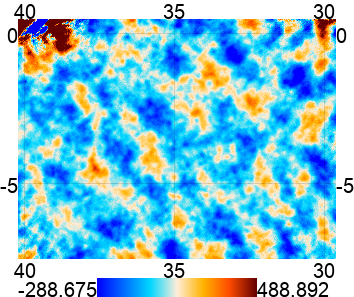

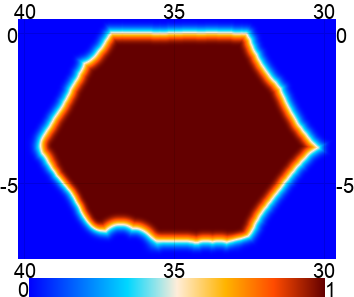

In [4]:
# Slice the splits and coadd map to ensure they align with the window
s_splits = enmap.extract(splits, window.shape, window.wcs)
s_coadd = enmap.extract(coadd, window.shape, window.wcs)

# Plot the first split I map and the window
eshow(s_splits[0, 0], **map_kwargs)
eshow(window, **map_kwargs)

Great! If we compare the above map "extracted" map to the previous "raw" map, we see that the shape and coordinates align with the window map, which is what we wanted.

The noise prescription also requires the inverse-variance maps corresponding to the splits and the coadded map (see Table 1 of [Section 1](Section_1_Introduction.ipynb)):

In [5]:
# Load the inverse-variance maps for the splits and for the coadd map
ivar_splits = [enmap.read_map(path + f'act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_set{i}_ivar.fits') for i in range(4)]
ivar_coadd = enmap.read_map(path + 'act_dr4.01_s13_D6_pa1_f150_nohwp_night_3pass_4way_coadd_ivar.fits')

# Convert ivar_splits from list to enmap
ivar_splits = enmap.enmap(ivar_splits)

Although in principle the inverse-variance maps contain the I, Q, U matrix elements at every pixel, as noted in [Aiola et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=ACT_DR4_A20_v20200420.pdf) we find that the matrices are well approximated by the large-hit-count, well-cross-linked limit. That is, the off diagonal covariance elements are ~0, and the QQ, UU variance elements are each twice as large as II. Therefore, in DR4 we release only the intensity *inverse-variance* map for each split and coadd, which contains all the map-based inverse-variance information.

We need to reconstruct the polarization inverse-variance maps. For convenience, DR4 adopts the convention of absorbing the polarization factor of 2 into the power spectra by *not* accounting for it here:

In [6]:
def make_IQU_ivars(ivars):
    '''Copy the inverse-variance I map into an I, Q, U array'''
    ndims = len(ivars.shape)

    # I, Q, U axis in pixell is always the 3rd from the right
    expand_ivars = np.expand_dims(ivars, axis = -3)

    # We need 3 copies of the existing map along the I, Q, U axis 
    reps = np.ones(ndims+1, dtype = int)
    reps[-3] = 3
    copy_ivars = np.tile(expand_ivars, reps)

    return enmap.samewcs(copy_ivars, ivars)

# Get the IQU inverse-variance maps for each split and for the coadd map
ivarIQU_splits = make_IQU_ivars(ivar_splits)
ivarIQU_coadd = make_IQU_ivars(ivar_coadd)

Again, we use the enmap.extract function, referenced to the common boundary window, to regularize the shape and wcs of the inverse-variance maps:

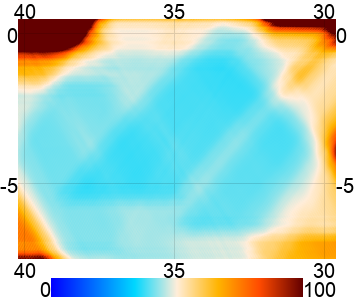

In [7]:
# Slice the inverse-variance maps to ensure they align with the window
s_ivarIQU_splits = enmap.extract(ivarIQU_splits, window.shape, window.wcs)
s_ivarIQU_coadd = enmap.extract(ivarIQU_coadd, window.shape, window.wcs)

# Plot the first split r.m.s. error map
eshow(1/np.sqrt(s_ivarIQU_splits[0, 0]), min = 0, max = 100, **map_kwargs)

A quick sanity-check:

In [8]:
# For clarity the shape and wcs of everything matches up correctly
print('Splits')
print('Maps:', s_splits.shape, s_splits.wcs)
print('Ivars:', s_ivarIQU_splits.shape, s_ivarIQU_splits.wcs, '\n')
print('Coadds')
print('Maps:', s_coadd.shape, s_coadd.wcs)
print('Ivars:', s_ivarIQU_coadd.shape, s_ivarIQU_coadd.wcs, '\n')
print('Window')
print(window.shape, window.wcs)

Splits
Maps: (4, 3, 963, 1272) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[755.5,900]}
Ivars: (4, 3, 963, 1272) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[755.5,900]} 

Coadds
Maps: (3, 963, 1272) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[755.5,900]}
Ivars: (3, 963, 1272) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[755.5,900]} 

Window
(963, 1272) car:{cdelt:[-0.008333,0.008333],crval:[33.94,0],crpix:[755.5,900]}


## Part 2: Generate Noise Power Spectra

The noise prescription takes the difference between each split map and the coadd to be an estimate of the pure noise in the data. We'll refer to these differences as "null" maps, but just to be clear, they are formally a map of the difference between the *realization* of the split-map noise and the *realization* of the coadd map noise. In general, we expect to visually recognize a lot of low-frequency atmospheric noise. 

So far, we have only been plotting the I map of the first split, but here we will look at the I, Q, and U maps. As you see here, the maps are released together, so calling the first of the "null" maps gives us a plot of all three components:

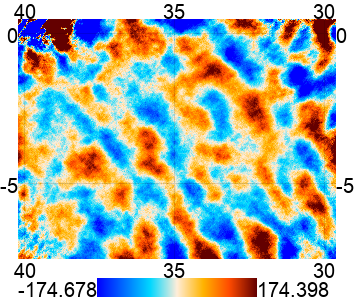

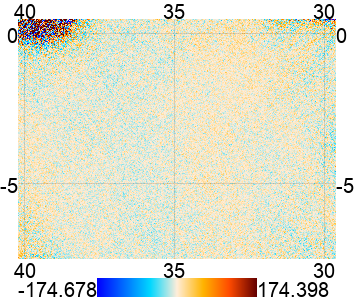

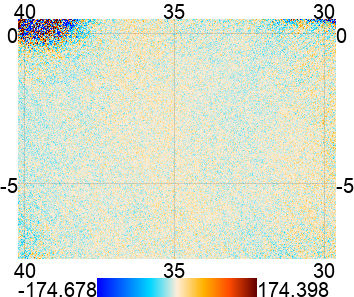

In [9]:
# Subtract the coadd map from each split map
d = s_splits - s_coadd

# Plot the first split null maps
eshow(d[0], **map_kwargs)

As an aside, we can directly check the definition of the coadd map given in [Choi et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=choi_etal_2020.pdf) -- the inverse-variance-weighted sum of the split maps. Comparing this quantity to the DR4-provided coadd map shows the two are in exceptional agreement for each of I, Q, U:

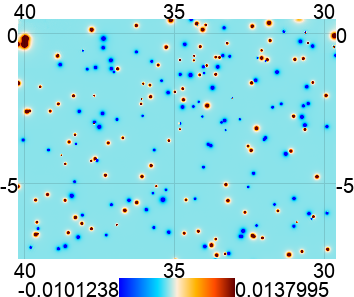

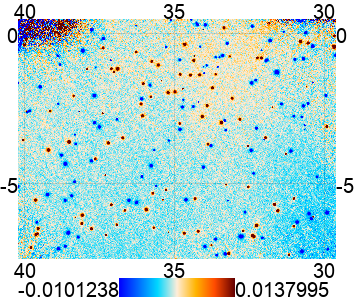

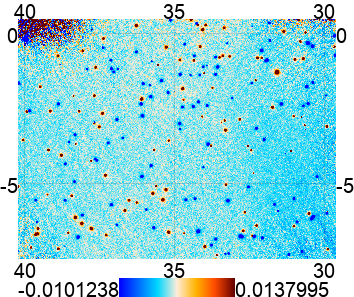

In [10]:
def make_coadd(maps, ivars):
    '''Get the coadded map from a set of split maps and their inverse-variances'''
    c = np.sum(maps * ivars, axis = 0)
    c /= np.sum(ivars, axis = 0)
    return enmap.samewcs(c, maps)

# The constructed coadd map
c = make_coadd(s_splits, s_ivarIQU_splits)

# Compare to the DR4 coadd map
eshow(c - s_coadd, **map_kwargs)

Note the colorbar is in units of $\mu K_{cmb}$, so the errors are negligible compared to the CMB anisotropy. For completeness, we use the DR4-provided coadd map in the rest of this notebook.

Anywho, back to noise sims! Our goal will be to analyze and apply the frequency content of the null maps. Before taking any Fourier transforms, we need to apply both our window and a "flattening" weight map to the null maps. The flattening weight is defined as the inverse *r.m.s. error* of the null maps and results in a map that is homogeneous and on small scales has white noise with unit variance (or twice that for polarization with our convention). Based on the definition of the null map above, this turns out to be given by the following function (work it out for yourself or refer to [Choi et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=choi_etal_2020.pdf)!):


<ipython-input-11-35a2ce23ae38>:3: RuntimeWarning: divide by zero encountered in true_divide
  inv_flat_sq = np.nan_to_num(1/ivar_splits - 1/ivar_coadd)


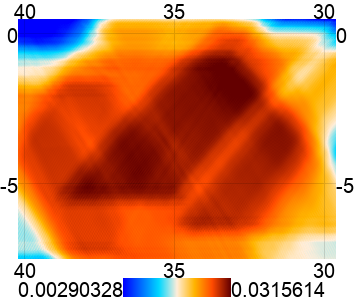

In [11]:
def make_flattening_weight(ivar_splits, ivar_coadd):
    '''The inverse-rms-error for the null maps'''
    inv_flat_sq = np.nan_to_num(1/ivar_splits - 1/ivar_coadd)
    return enmap.samewcs(1/np.sqrt(inv_flat_sq), ivar_coadd)

# Get the flattening weights for our null maps
flattening_weight = make_flattening_weight(s_ivarIQU_splits, s_ivarIQU_coadd)

# Plot the flattening weight for the first split I map
eshow(flattening_weight[0, 0], **map_kwargs)

We add the call to `nan_to_num` because some inverse-variance pixels are 0-valued in the map corners.

Now we examine the 2D Fourier power spectrum of the window-weighted, flattening-weighted null maps.

In [12]:
k_d = enmap.fft(window * flattening_weight * d, normalize = 'phys')

Because the null maps contain *independent* realizations of the split-map noise, we can define the power spectrum estimator as a simple average:

In [13]:
def get_power(k_maps, a, b, window, func = np.real):
    '''The 2D power spectrum for a set of fourier null maps

    a: 0, 1, or 2 for I, Q, U
    b: 0, 1, or 2 for I, Q, U
    window: apodized boundary window for the patch'''
    n = len(k_maps)

    # Extract I, Q, U components    
    ka_map = k_maps[:, a]
    kb_map = k_maps[:, b]

    # Get squared apodization
    w2 = np.mean(window**2)

    # Note the denominator is n*(n-1)
    power = 1/n/(n-1) * enmap.samewcs(np.sum(ka_map * np.conj(kb_map), axis = 0), ka_map)
    
    # As in previous notebooks, "correct" the power level with this apodization factor
    return func(power) / w2

The prefactor of $\frac{1}{n(n-1)}$ captures that we want to build a covariance matrix of the coadd map noise, but the cross-power is that of a single null map. Because the null map subtracts the coadd map itself, there is one less degree of freedom than the number of splits (hence the $\frac{1}{n-1}$). Then as we average over independent realizatations, we divide by $n$. 

Let's check out our 2D power spectra! We have 9 spectra (only 6 of which are independent) which we'll place in a new object $P_{ab}$, with $a$ and $b$ tracking the Stokes components:

IXI


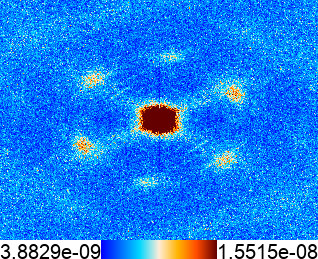

IXQ


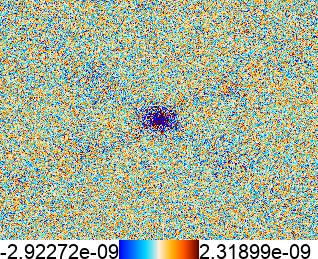

IXU


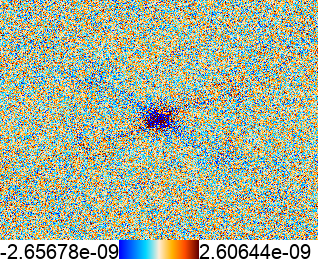

QXQ


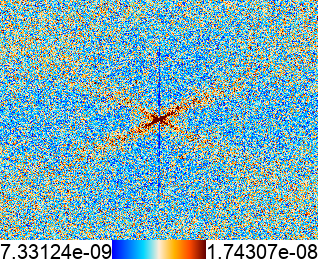

QXU


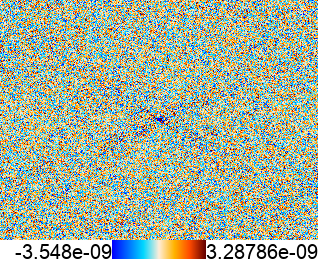

UXU


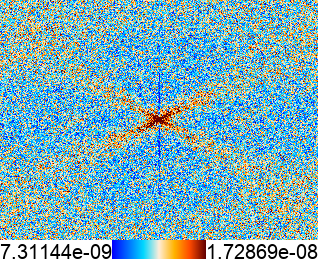

In [14]:
# The last two indices should match the shape of the (real space) map
P_ab = enmap.empty(shape = [3, 3] + list(k_d.shape[-2:]), wcs = k_d.wcs)

for i in range(3): 
    for j in range(i, 3):
        P_ab[i, j] = get_power(k_d, i, j, window)
        P_ab[j, i] = P_ab[i, j] # Symmetric matrix

        # Plot the set of auto and cross spectra
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        print(f'{comp1}X{comp2}')
        eshow(enmap.fftshift(P_ab[i, j]), **fourier_kwargs)

As is explained in the text of [Choi et al. (2020)](https://phy-wiki.princeton.edu/polwiki/pmwiki.php?n=Papers.Papers?action=download&upname=choi_etal_2020.pdf), the 2D power spectra are not isotropic. However, we will at least assume that the above spectra are the same at all (real-space) points within the map, up to overall magnitude. Under this assumption, each mode in a given spectrum is uncorrelated with all other modes in that spectrum (though clearly the same mode in different spectra *are* correlated!), which will facilitate generating random noise realizations later on in this notebook.

We can learn a bit more by azimuthally binning the noise spectra and examining only their $l$ dependence. We borrow the $l$-binning function from [Section 7](Section_7_power_spectra_part_1.ipynb):

In [15]:
def bin(data, imap, lmax, bin_size):
    modlmap = imap.modlmap()

    # Define the bins and bin centers
    bins = np.arange(0, lmax, bin_size)
    centers = (bins[1:] + bins[:-1])/2.

    # Bin the power spectrum 
    digitized = np.digitize(np.ndarray.flatten(modlmap), bins, right=True)
    binned = np.bincount(digitized, data.reshape(-1))[1:-1]/np.bincount(digitized)[1:-1]
    return centers, binned

We plot the auto-spectra as solid lines and the cross-spectra as dashed lines:

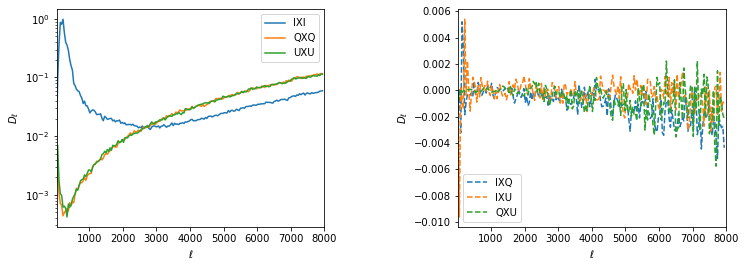

In [16]:
# Prepare plots
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 4),
                        gridspec_kw = {'wspace': 0.5, 'hspace': 0.3})

for i in range(3):
    for j in range(i, 3):
        if i == j: ls = '-'
        else: ls = '--'
        cents, bells = bin(P_ab[i, j], d, 8000, 40)
        
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        if i == j:
            ind = 0
            axs[ind].set_yscale('log')
        else:
            ind = 1
            axs[ind].set_yscale('linear')
        axs[ind].plot(cents, bells*cents**2./2./np.pi, ls = ls, label=f"{comp1}X{comp2}")
        axs[ind].set_xlim(30, 8000)
        axs[ind].legend()
        axs[ind].set_xlabel("$\\ell$")
        axs[ind].set_ylabel("$D_{\\ell}$")

We have recovered the two primary features of the noise auto-spectra! That is, at low $l$, there is the expected atmospheric 1/f contribution. The $l$-knee changes depending on which combination of polarization components we're looking at. At large $l$, the noise auto-spectra hit a white-noise floor (in $D_{l}$-space white noise rises as ~$l^2$).

## Part 3: Building the Noise Covariance Matrix

Our set of 6 cross-spectra gives an estimate of the (3x3 block, symmetric) covariance matrix of the Fourier modes, whose elements carry polarization component labels (I, Q, U) *and* Fourier-index labels ($l_y$, $l_x$). Clearly, however, this estimate is itself noisy, so we would like to smooth the object in such a way as to preserve its visually-interesting features, but cut-out the high-frequency graininess. Then, we can sample from the smoothed object, which we take to be closer to the "true" noise covariance. 

There are 3 steps to generating the final noise covariance matrix, which we cover here in order:
* Radial profile fitting for $l$ > 500
* Smoothing the power spectra
* Isotropizing 2D spectra for $l$ < 300

### 3.a Radial Profile Fitting of Power Spectra ($l$ > 500)

One feature of the data we wish to preserve is its strong 1/f character at low $l$. In later steps we will apply a low-pass filter to the spectra in order to remove high-frequency noise, but due to the sharpness of the 1/f peaks, such a process is liable to cause "ringing" in the smoothed spectra. Therefore, we first remove (and store) the overall radial profile of each spectrum, and later we smooth only the "flattened" spectra.

We perform the radial fit at $l$ > 500 to the form $f(|\vec{l}|) = \left(\left(\frac{l_{knee}}{|\vec{l}|}\right)^{-\alpha} + 1\right)*w^2$, where $w^2$ is the white noise power in the auto- or cross-spectrum. For each azimuthally-binned spectrum, we store the best-fit parameters ($l_{knee}, \alpha, w^2$) and divide out the corresponding radial profile, creating a red-noise-flattened 2D power spectrum.

Note that for demonstration purposes, to make the curve-fitting routine numerically stable we first normalize the data by $w^2$, as determined by the mean value of the spectrum at large $l$:

In [17]:
# For each IQU X IQU cross, hold l_knee, alpha, w2
rad_params_ab = np.empty(shape = (3, 3, 3))

# Model without white noise level (for numerical stability)
def rad_fit(x, l0, a):
    return ((l0/x)**-a + 1)

# Define bounds on ell_knee, alpha
bounds = ((0, -5), (9000, 1))

# Get parameters
for i in range(3):
    for j in range(i, 3):

        # Get 1d binned spectrum
        ell, c_ell = bin(P_ab[i, j], k_d, 8000, 40)

        # Get white noise level
        # Set to mean of spectrum at ell > 7500
        w2 = c_ell[ell > 7500].mean()

        # Define fit mask (values to be excluded)
        mask = ell < 500
        ell_fit = ell[~mask]
        c_ell_fit = c_ell[~mask]

        # Perform fit
        # Normalize y values by white noise level
        rad_params_ab[i, j, :2], _ = curve_fit(rad_fit, ell_fit, c_ell_fit/w2, p0 = [3000, -4], bounds = bounds)
        rad_params_ab[i, j, 2] = w2
        rad_params_ab[j, i] = rad_params_ab[i, j] # Symmetric matrix

And we can plot the fit:

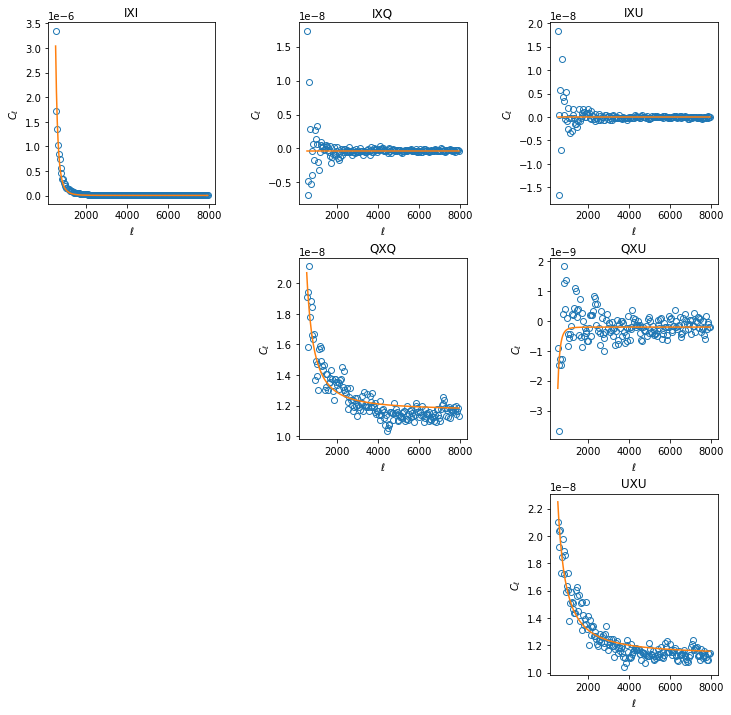

In [18]:
# Prepare plots
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize = (12, 12),
                        gridspec_kw = {'wspace': 0.5, 'hspace': 0.3})

# Wrapper function for plotting
# Adds white noise back in
def rad_fit_wrap(x, l0, a, w2):
    return rad_fit(x, l0, a) * w2

# Plot results
for i in range(3):
    for j in range(i, 3):
        
        # Get 1d binned spectrum
        ell, c_ell = bin(P_ab[i, j], k_d, 8000, 40)
        mask = ell < 500
        ell_fit = ell[~mask]
        c_ell_fit = c_ell[~mask]
        
        # Plot
        axs[i, j].plot(ell_fit, c_ell_fit, linestyle = 'none', marker = 'o', markerfacecolor = 'none') # Data
        axs[i, j].plot(ell_fit, rad_fit_wrap(ell_fit, *rad_params_ab[i, j])) # Best fit curve
        
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        axs[i, j].set_title(f'{comp1}X{comp2}')
        
        axs[i, j].set_xlabel('$\ell$')
        axs[i, j].set_ylabel('$C_\ell$')
        axs[i, j].set_yscale('linear')
        if i is not j:
            axs[j, i].set_axis_off()

Finally, we generate the "red-noise-flattened" power spectra, which we place in the object $P_{ab}^{f}$:

IXI


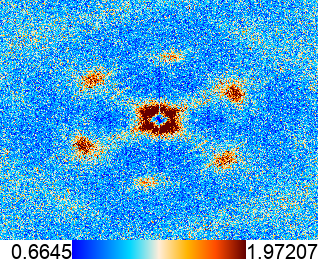

IXQ


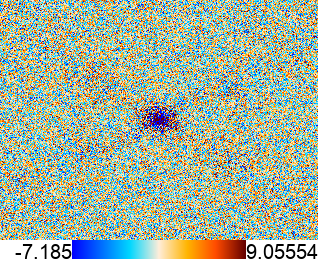

IXU


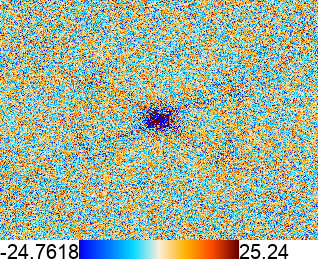

QXQ


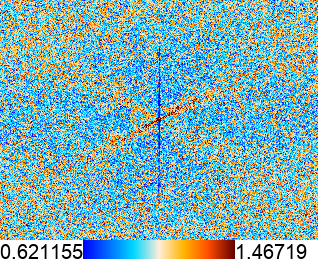

QXU


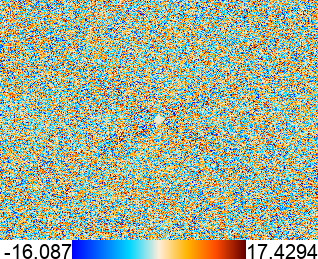

UXU


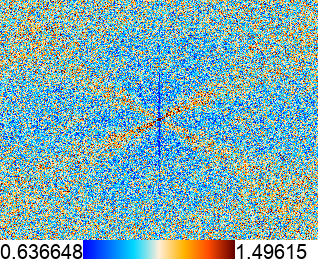

In [19]:
# The last two indices should match the shape of the (real space) map
P_ab_f = enmap.empty(shape = [3, 3] + list(k_d.shape[-2:]), wcs = k_d.wcs)

modlmap = window.modlmap()
modlmap[..., 0, 0] = 1e-14 # Avoid divide by zero Warning

# Store flattened spectra
for i in range(3):
    for j in range(i, 3):
        
        P_ab_f[i, j] = P_ab[i, j] / (rad_fit_wrap(modlmap, *rad_params_ab[i, j]))
        P_ab_f[j, i] = P_ab_f[i, j] # Symmetric matrix

        # Plot the set of auto and cross spectra
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        print(f'{comp1}X{comp2}')
        eshow(enmap.fftshift(P_ab_f[i, j]), **fourier_kwargs)

Looks great! We can see that all of the "whitened", a.k.a "flattened," spectra contain anisotropies which we want to keep, as well as high frequency noise which we want to smooth away.

### 3.b Power-Spectra Smoothing

Another salient feature of the 2D spectra we'd like to capture are their interesting anisotropies. Unlike the isotropic CMB, we see varying features in the 2D spectrum as we sweep around the modes in azimuth. However, there also seems to be high-frequency noise in the 2D spectra themselves -- therefore, we'd like to isolate the interesting anisotropies from the spurious graininess of the noise. We do this by smoothing the 2D power spectra.

The procedure for smoothing is fairly straightforward: we convolve each flattened 2D power spectrum with a low pass filter. In this step, we make no distinction between low and high $l$, as we did in fitting the radial profile -- the entire (flattened) 2D spectrum is smoothed altogether. 

The low-pass filter we select is a simple sigmoid-like function $f(\vec{k}) = (1 + (2|\vec{k}|D)^\beta)^{-1}$ where $\vec{k}$ are the components of the *Fourier transform of the flattened power spectrum in pixels* and $\beta$ is even. We therefore read-off the FWHM (in one dimension) of the filter as $1/D$, meaning this is *similar* to an average of a "square" of size $D$ pixels. For our region (D6), we select $D = 8$ and $\beta = 4$:


Text(0, 0.5, 'filter')

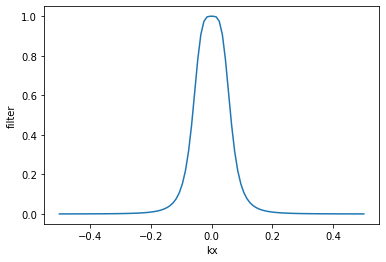

In [20]:
# Define the filter function
def make_filter_map(k, D, beta):
    '''The generic low pass filter we apply to our
    flattened 2D power spectra

    k: the Fourier mode map, with shape = (2, Ny, Nx)
    or shape = (1, N)
    D: characteristic size of filter in pixels of image space
    beta: degree of the filter
    '''
    # Get the modulus of the point in Fourier space
    modk = np.linalg.norm(np.atleast_2d(k), axis = 0)
    return 1 / (1 + (2 * modk * D)**beta)

# Plot a 1d-slice of the filter
kx = np.linspace(-0.5, 0.5, 100)
plt.plot(kx, make_filter_map(kx, 8, 4))
plt.xlabel('kx')
plt.ylabel('filter')

Note that we are essentially treating the 2D power spectra plotted in Part 3.a as any old image, and so the low-pass filter just operates in the Fourier domain of that image:

In [21]:
# Smooth a set of ndmaps with a filter
def smooth_maps(imaps, filter):
    '''
    imaps is a set of ndmaps with arbitrary leading dimensions
    filter is a single map with the same shape as any imap
    '''

    # Fourier transform the input maps
    k_maps = enmap.fft(imaps)

    # Multiply by our filter and inverse transform back
    return enmap.ifft(k_maps * filter).real

Now it's a few simple lines of code to emerge with our flattened, smoothed power spectra, which we'll keep in a new object called $P_{ab}^{fs}$. Recall our filter smooths $D = 8$ pixels with degree $\beta = 4$. To make it easier to see and understand the result, we also plot a much more aggressively smoothed spectrum (IXI) with $D = 40$:

D = 8
IXI


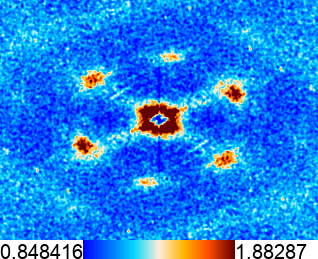

IXQ


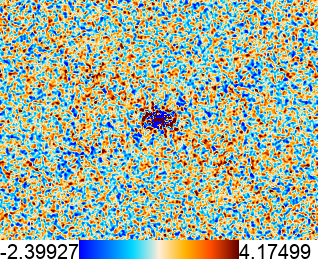

IXU


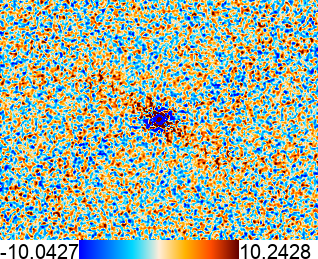

QXQ


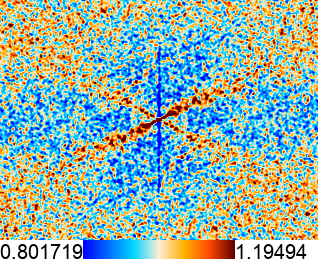

QXU


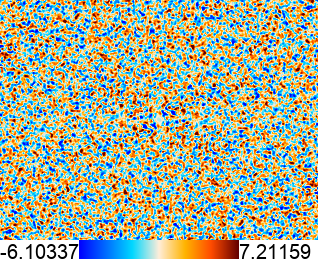

UXU


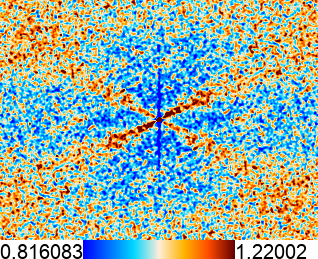

D = 40
IXI


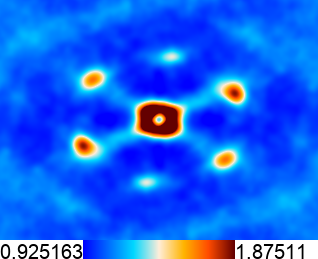

In [22]:
# Set our 2D filter parameters
D8 = 8
D40 = 40
beta = 4

# Make the fourier mode map in pixels
# Generalizes np.fft.fftfreq to 2D
l2d = k_d.lmap()
l2d[0] /= -2*np.min(l2d[0]) # delta-y has normal sign
l2d[1] /= -2*np.max(l2d[1]) # delta-x has inverse sign

# Make the fourier space filters
filter8 = make_filter_map(l2d, D8, beta)
filter40 = make_filter_map(l2d, D40, beta)

# Smooth our flattened power spectra
P_ab_fs = smooth_maps(P_ab_f, filter8)
P_00_fs_40 = smooth_maps(P_ab_f[0, 0], filter40)

# Plot the set of auto and cross spectra
print('D = 8')
for i in range(3):
    for j in range(i, 3):
    
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        print(f'{comp1}X{comp2}')
        eshow(enmap.fftshift(P_ab_fs[i, j]), **fourier_kwargs)

# For the IXI auto spectrum, demonstrate a heavily smoothed map
print('D = 40')
print('IXI')
eshow(enmap.fftshift(P_00_fs_40), **fourier_kwargs)

Hopefully, the $D = 40$ smoothed spectrum demonstrates what's going on here. The $D = 8$ smoothed spectra appear the same as the flattened, unsmoothed in section 3.a only because we are plotting downgraded maps, as specified in `fourier_kwargs` in the beginning of the notebook. If you want, try plotting the binned power spectra now -- if you compare to before the smoothing step, you will see there really is much less high-frequency "graininess" in the spectra.

### 3.c Isotropizing the 2D Power Spectra ($l$ < 300)

Finally, in our noise prescription, we "isotropize" the 2D spectra for the smallest modes. We claim that because the number of modes at low $l$ is small, any anisotropies there are more likely statistical variations (or data processing artifacts) than real features of the "true" covariance matrix. Therefore, we replace each (flattened, smoothed) 2D spectrum (for $l$ < 300) with an azimuthally-symmetric form $P_{ab}^{fs}(\vec{l}) = Ae^{-l_0/|\vec{l}|} + B$.

To get the best-fit parameters for each 2D spectrum, we fit to the flattened, *unsmoothed* spectrum ($P_{ab}^f$), using an $l$ range up to $l = 600$. We can borrow the curve-fitting code from part 3.a, and bump up the bin width in $l$: 

In [23]:
# For each I, Q, U cross, hold l0, A, B
iso_params_ab = np.empty(shape = (3, 3, 3))

# Isotropic model that will replace the spectra at low ell
def iso_fit(x, l0, A, B):
    return A*np.exp(-l0/x) + B

# Define bounds on l0, A, B
bounds = ((2, -np.inf, 0), (600, np.inf, np.inf))

# Get parameters
for i in range(3):
    for j in range(i, 3):

        # Get 1d binned spectrum
        ell, c_ell = bin(P_ab_f[i, j], k_d, 8000, 60)

        # Define fit mask (values to be excluded)
        mask = ell > 600
        ell_fit = ell[~mask]
        c_ell_fit = c_ell[~mask]

        # Perform fit
        iso_params_ab[i, j], _ = curve_fit(iso_fit, ell_fit, c_ell_fit, p0 = [20, 1, 0], bounds = bounds, maxfev = 5000)
        iso_params_ab[j, i] = iso_params_ab[i, j] # Symmetric matrix

And we can plot the fit:

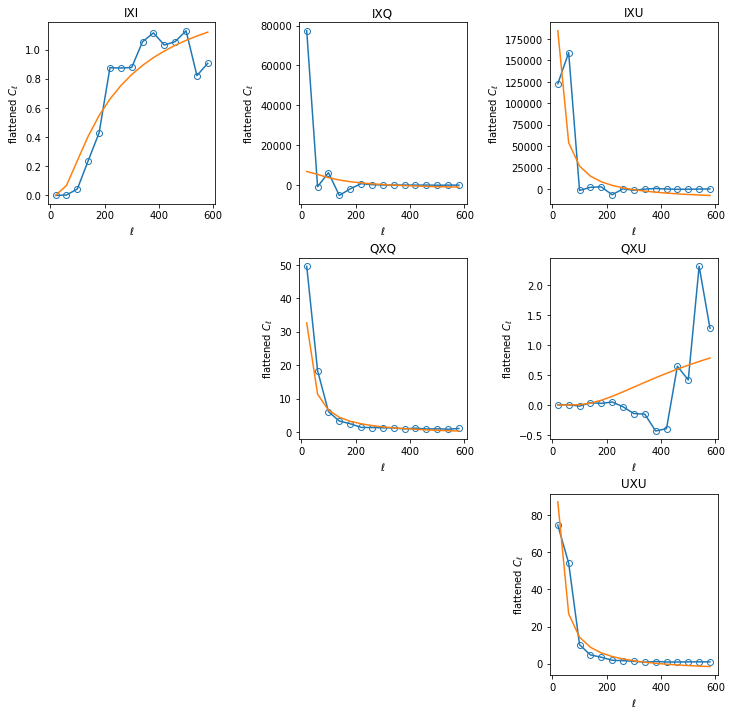

In [24]:
# Prepare plots
fig, axs = plt.subplots(nrows = 3, ncols = 3, figsize = (12, 12),
                        gridspec_kw = {'wspace': 0.5, 'hspace': 0.3})

# Plot results
for i in range(3):
    for j in range(i, 3):
        
        # Get 1d binned spectrum
        ell, c_ell = bin(P_ab_f[i, j], k_d, 8000, 40)
        mask = ell > 600
        ell_fit = ell[~mask]
        c_ell_fit = c_ell[~mask]
        
        # Plot
        axs[i, j].plot(ell_fit, c_ell_fit, marker = 'o', markerfacecolor = 'none', label = 'data')
        axs[i, j].plot(ell_fit, iso_fit(ell_fit, *iso_params_ab[i, j]), label = 'fit')
        
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        axs[i, j].set_title(f'{comp1}X{comp2}')
        
        axs[i, j].set_xlabel('$\ell$')
        axs[i, j].set_ylabel('flattened $C_\ell$')
        axs[i, j].set_yscale('linear')
        if i is not j:
            axs[j, i].set_axis_off()

The large spikes in noise powerat very low $l$ simply tells us that the "red noise" model from part 3.a, which was only fit to large $l$, does not grow fast enough at the largest spatial scales. Nevertheless, the isotropic fit here does a got job capturing a "smooth" version of this residual power, which *is* the point.

Finally, we put all the pieces together to emerge with our full map-space noise covariance matrix for the D6 patch! In order:
* For each auto and cross spectrum, replace the $l < 300$ range of the 2D *smoothed, flattened* spectrum with our isotropic fit (which is by definition pretty smooth). We can store this in a new object $P_{ab}^{fsr}$, with the "r" for "replaced."
* For each auto and cross spectrum, multiply $P_{ab}^{fsr}$ by the "red noise" radial fit for that spectrum (from part 3.a)
* For each auto and cross spectrum, replace the "0" mode with the value 0.

The last point is necessary because a true noise map should have no DC power! We'll store the covariance matrix in the object $C_{ab}$:

IXI


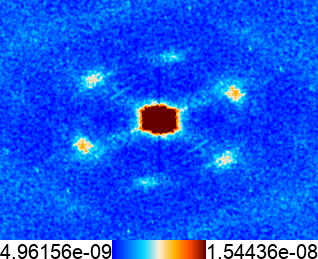

IXQ


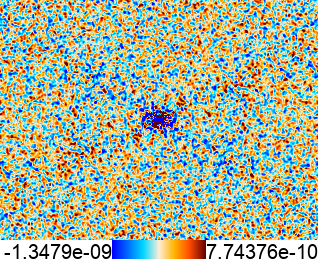

IXU


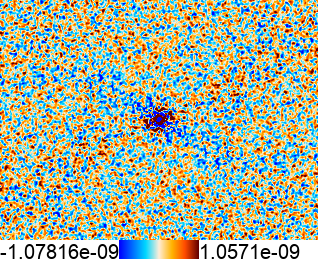

QXQ


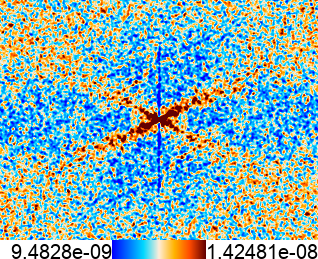

QXU


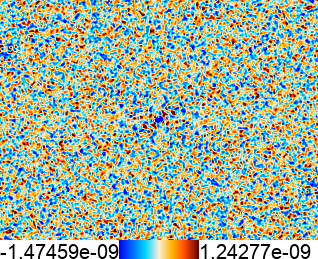

UXU


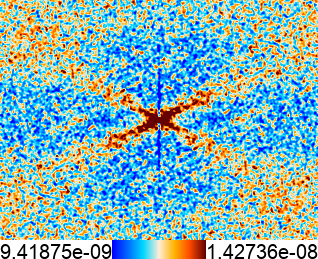

In [25]:
# The last two indices should match the shape of the (real space) map
C_ab = enmap.empty(shape = P_ab_fs.shape, wcs = k_d.wcs)

# New object holds smooth, flat spectra with isotropic replacement at low ell
P_ab_fsr = P_ab_fs.copy()

# Get the mask for the isotropic low-ell replacement
# These values will be left alone
modlmap = window.modlmap()
modlmap[..., 0, 0] = 1e-14 # Avoid divide by zero Warning
mask = modlmap > 300

for i in range(3):
    for j in range(i, 3):

        # Replace the low ell portion of each 2D spectrum
        P_ab_fsr[i, j, ~mask] = iso_fit(modlmap[~mask], *iso_params_ab[i, j])

        # Multiply the flattened smoothed spectra by the radial fit
        C_ab[i, j] = P_ab_fsr[i, j] * rad_fit_wrap(modlmap, *rad_params_ab[i, j])
        
        # Set DC power -- (ly, lx) = (0, 0) --  to 0
        C_ab[i, j, 0, 0] = 0
        
        C_ab[j, i] = C_ab[i, j] # Symmetric matrix
    
        # Show the covariance matrix
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]
        print(f'{comp1}X{comp2}')
        eshow(enmap.fftshift(C_ab[i, j]), **fourier_kwargs)

Hooray! We are *almost* ready to generate on-the-fly noise simulations.

## Intermission: Brief Formalism of the sqrt-Covariance Matrix

Let's summarize what we have done and where we are going. Using our "split" maps of the D6 region, we generate independendent realizations of the map-domain noise. From these noise realizations, we get an estimate of the full fourier-space mode-mode noise covariance matrix. We then process that estimate by extracting features we think represent the true, underlying covariance: we "flatten" the power, smooth it, isotropize it at large spatial scales, and "unflatten" it.

But now, we want to sample from the distribution parameterized by our processed covariance matrix. This is where the utility of fourier-space enters: while different locations (pixels) in the map-domain noise are correlated, different "locations" (modes, or pixels) in the Fourier-domain noise are *not*. Each (3-component) mode is an *independent,* normal, mean-0 vector, with a 3x3 covariance matrix whose elements are defined by the part 3.c power spectra (at that given pixel in Fourier space).

Ordinarily, if we have a set of independent, mean-0 normal variables $x_i$, each with variance $\sigma_i^2$, we can generate a sample of $\vec{x}$ by multiplying a *diagonal* matrix $\textbf{D}$, with each $\sigma_i$ along the diagonal, by an uncorrelated unit-normal vector $\vec{u}$: $$\textbf{D}\vec{u} \sim \mathcal{N}(\vec{0}, \vec{\sigma^2}) \sim \vec{x}$$ But if the entries of $\vec{x}$ are correlated, with covariance matrix $\textbf{C}$, we must first rotate into coordinates that diagonalize $\textbf{C}$: $$\tilde{\textbf{C}} = \textbf{UCU}^{-1}$$ where $\textbf{U}$ is a unitary matrix and $\tilde{\textbf{C}}$ is diagonal. Once in this basis, we generate the uncorrelated unit-normal vector $\vec{u}$, apply a diagonal matrix $\tilde{\textbf{D}}$ whose entries are the *square-root* of those of $\tilde{\textbf{C}}$, and rotate back to the original coordinates: $$\textbf{U}^{-1}\tilde{\textbf{D}}\vec{u} \sim \mathcal{N}(\vec{0}, \textbf{C}) \sim \vec{x}$$ Note that the $n$-dimensional distribution describing the elements of $\vec{u}$ is spherically symmetric. Therefore, because $\textbf{U}$ preserves norms, the vector: $$\textbf{U}\vec{u} \sim \mathcal{N}(\vec{0}, \vec{1}) \sim \vec{u}$$ and we can write: $$\textbf{U}^{-1}\tilde{\textbf{D}}\textbf{U}\vec{u} \sim \mathcal{N}(\vec{0}, \textbf{C}) \sim \vec{x}$$ Since $\tilde{\textbf{D}}$ is defined such that $D_{ij} = \sqrt{\tilde{C_{ij}}}$, we define the *square-root covariance matrix* $\textbf{S}_c \equiv \textbf{U}^{-1}\tilde{\textbf{D}}\textbf{U}$, which if known, makes generating samples of $\vec{x}$ easy!

In our case, we have $N_{modes} = N_{pixels}$ mean-0 normal vectors in $n = 3$ (complex) dimensions, corresponding to the polarization components, each with its own 3x3 covariance matrix. As explained above, these vectors are *uncorrelated* with one another. Thus, the sqrt-covariance matrix for our simulations is the $N_y$ * $N_x$ set of $\textbf{S}_c$, one for each 2D Fourier mode. Fortunately, pixell has a method for efficiently diagonalizing (and square-rooting) our covariance matrix:

In [26]:
sqrtC_ab_nb9 = enmap.multi_pow(C_ab, 0.5)

Due to the proper treatment just described, these sqrt-covariance matrices are much more complicated than the simple pixel-wise square root of the spectra in 3.c. Plot the difference if you'd like!

## Part 4: Generating Noise Simulations

All of the hard work so far went into building the sqrt-covariance matrix object; generating noise simulations is relatively straightforward. We just follow the prescription outlined above, for each pixel in 2D Fourier space: draw from the complex standard normal distribution in 3 dimensions, and then apply the sqrt-covariance matrix.

For this section, we utilize the actual sqrt-covariance matrix generated by the [actsims](https://github.com/ACTCollaboration/actsims) pipeline. This matrix differs from the object in the previous section, and we warn users of this notebook to treat the preceding product as a demonstration only; it is not the actual pipeline. If you are interested in generating simulations for your own analysis, please refer to the [actsims](https://github.com/ACTCollaboration/actsims) library.

First load the sqrt-covariance matrix:

In [27]:
# Sqrt-covariance matrix for same season, patch, array as rest of notebook
sqrtC_ab_dr4 = enmap.read_map(path + 'act_dr4.01_s13_D6_pa1_coadd_est_True_covsqrt.fits')

Pixell provides the machinery to generate the complex standard normal samples in the correct shape:

In [28]:
# Generate our complex standard normal vectors
# In order to broadcast with the sqrt-covariance matrix,
# the shape should be (3, Ny, Nx)
Ny, Nx = sqrtC_ab_dr4.shape[-2:]
c_rand_norm = enmap.rand_gauss_harm((3, Ny, Nx), sqrtC_ab_dr4.wcs)

It should be noted that all of the randomness is injected into the simulation in this cell.

The matrix multiplication is made simple by another pixell method, which wraps the [numpy einsum](https://numpy.org/doc/stable/reference/generated/numpy.einsum.html) function:

In [29]:
# Apply the sqrt-covariance matrix to our complex standard normal vectors
k_d_sim = enmap.map_mul(sqrtC_ab_dr4, c_rand_norm)

We now have sampled the (mean-0, complex) Gaussian random field described by our processed power spectra. To generate our map-domain noise simulation, we first inverse-Fourier transform the realization (with the same normalization as in part 2!). Then, we must remove the "flattening weight" map from part 2, to properly rescale the noise r.m.s. for the desired split:

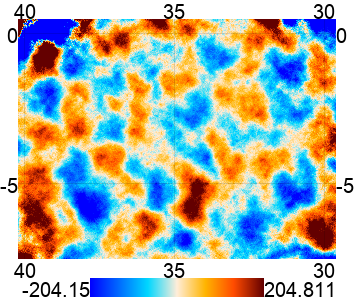

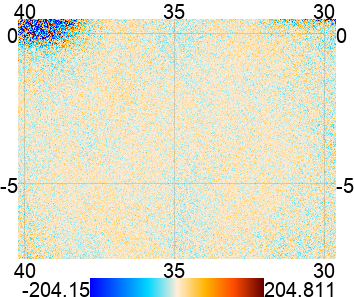

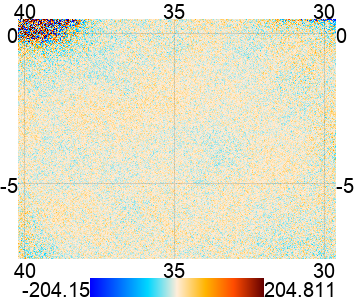

In [30]:
# Put the steps in a simple wrapper function
# Slice the map-domain data to size of window
def invert_noise_sim(split_num, fourier_maps, ivar_splits, ivar_coadd, window):
    '''Given the fourier-domain noise realization, produce the IQU map
    for the split given by split_num'''
    
    # Inverse transform
    d_sim = enmap.ifft(fourier_maps, normalize = 'phys').real
    
    # Slice map-domain data to size of window
    s_d_sim = enmap.extract(d_sim, window.shape, window.wcs)
    s_ivar_splits = enmap.extract(ivar_splits, window.shape, window.wcs)
    s_ivar_coadd = enmap.extract(ivar_coadd, window.shape, window.wcs)
    
    # Get the flattening weight map for our split
    flattening_weight = make_flattening_weight(s_ivar_splits[split_num], s_ivar_coadd)
    
    # Remove the flattening weight from the map
    n = len(ivar_splits)
    return np.sqrt(n) * s_d_sim / flattening_weight

# Show our noise simulation for first split
noise_sim_single_split = invert_noise_sim(0, k_d_sim, ivarIQU_splits, ivarIQU_coadd, window)
eshow(noise_sim_single_split, **map_kwargs)

Awesome! The extra factor of $\sqrt{n}$ just accounts for the convention we adopted in defining the power spectra, where we included an additional prefactor of $\frac{1}{n}$.

To save you from executing cells, we can of course wrap the whole thing in a single function call. Note the arguments are all products on disk!

In [31]:
# Given all our data products on disk, generate a full set of noise simulations on-the-fly
def get_noise_sims(sqrtcov, ivar_splits, ivar_coadd, window, fact = 1):
    '''Generate a new noise realization in each split.
    Return the full set of n_splits x n_components maps'''
    
    # Object to hold output maps
    n = len(ivar_splits)
    product_maps = enmap.empty(shape = [n, 3] + list(window.shape), wcs = window.wcs)
    
    # Generate a new Gaussian random field for each split
    for i in range(n):
        Ny, Nx = sqrtcov.shape[-2:]
        c_rand_norm = enmap.rand_gauss_harm((3, Ny, Nx), sqrtcov.wcs)
        k_d_sim = enmap.map_mul(sqrtcov, c_rand_norm)
        product_maps[i] = invert_noise_sim(i, k_d_sim, ivar_splits, ivar_coadd, window)
        
    return product_maps

# Run a full noise simulation for all splits
noise_sims_dr4 = get_noise_sims(sqrtC_ab_dr4, ivarIQU_splits, ivarIQU_coadd, window)

<ipython-input-11-35a2ce23ae38>:3: RuntimeWarning: divide by zero encountered in true_divide
  inv_flat_sq = np.nan_to_num(1/ivar_splits - 1/ivar_coadd)
<ipython-input-11-35a2ce23ae38>:3: RuntimeWarning: divide by zero encountered in true_divide
  inv_flat_sq = np.nan_to_num(1/ivar_splits - 1/ivar_coadd)


Every call to this function generates a set of I, Q, and U map-based noise realizations, for each of our 4 split maps, for our particular season/patch/array/freq combination (s13/D6/PA1/150 GHz).

We would like to compare the results of this simulation to the data for consistency. We compare the power spectra of the sims and the original "null" maps *without* the flattening weight applied this time. Note, our original null maps are still stored in the variable `d`.

To compare apples-to-apples, we need the coadd of our simulated (noise-only) splits:

In [32]:
noise_coadd_dr4 = make_coadd(noise_sims_dr4, s_ivarIQU_splits)

And we subtract the coadd from the sims to get simulated "null" maps:

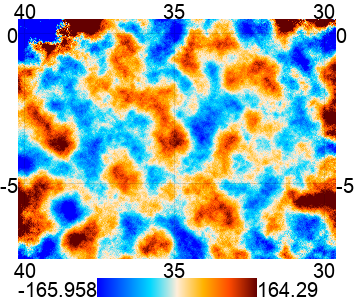

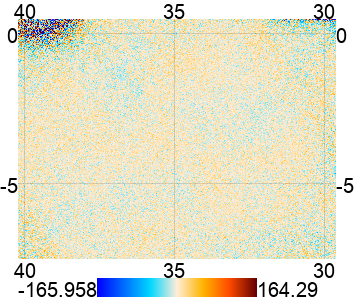

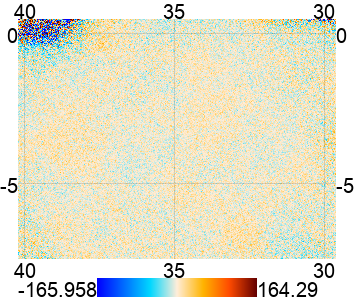

In [33]:
d_sim = noise_sims_dr4 - noise_coadd_dr4
eshow(d_sim[0], **map_kwargs)

Finally, we take the Fourier-transform of our apodized "null" sims and compare the binned power (in $|\vec{l}|$) to the data. For this by-eye comparison, we take the simple ratio of the sim vs. data cross-power *magnitudes*, but more sophisticated consistency checks (with a large set of simulations, see Choi et. al. 2020) are possible:

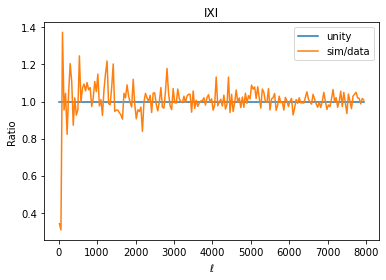

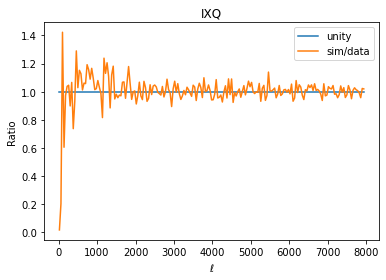

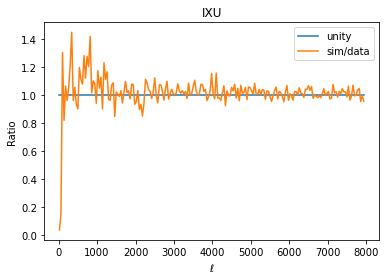

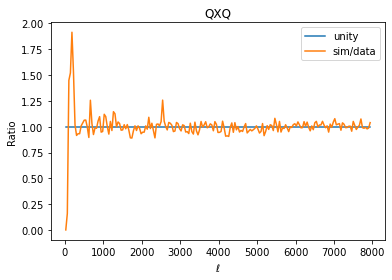

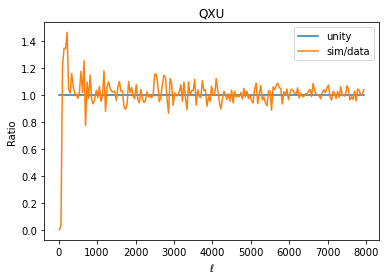

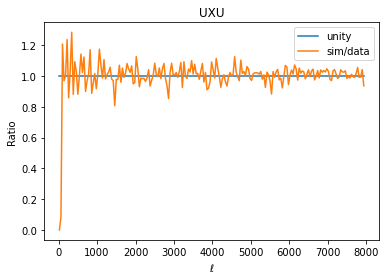

In [34]:
# Take the fourier transform of the null maps and the sims
k_d_unflat = enmap.fft(window * d, normalize = 'phys')
k_d_unflat_sim = enmap.fft(window * d_sim, normalize = 'phys')

# Set up the 2D spectra
# The last two indices should match the shape of the (real space) map
P_ab_unflat = enmap.empty(shape = [3, 3] + list(window.shape[-2:]), wcs = window.wcs)
P_ab_unflat_sim = enmap.empty(shape = [3, 3] + list(window.shape[-2:]), wcs = window.wcs)

for i in range(3): 
    for j in range(i, 3):
        
        #Build 2D spectra
        P_ab_unflat[i, j] = get_power(k_d_unflat, i, j, window, func = abs)
        P_ab_unflat_sim[i, j] = get_power(k_d_unflat_sim, i, j, window, func = abs)
        
        # Bin the 2D spectra in ell
        ell, c_ell_unflat = bin(P_ab_unflat[i, j], window, 8000, 40)
        _, c_ell_unflat_sim_dr4 = bin(P_ab_unflat_sim[i, j], window, 8000, 40)

        # Plot results
        comp1 = {0: 'I', 1: 'Q', 2: 'U'}[i]
        comp2 = {0: 'I', 1: 'Q', 2: 'U'}[j]

        # Ratios
        plt.plot(ell, np.ones(len(ell)), label = 'unity')
        plt.plot(ell, c_ell_unflat_sim_dr4/c_ell_unflat, label = 'sim/data')
        plt.xlabel('$\ell$')
        plt.ylabel('Ratio')
        plt.title(f'{comp1}X{comp2}')
        plt.legend()
        plt.show()

We see good agreement between the sims and the data especially at scales relevant to our cosmological analysis, excluding the lowest $l$. 

### Continue to next notebook

[Section 10](Section_10_E_B_maps.ipynb):  Look at how to generate E and B maps from I, Q, U maps. 